## Load the image and previous segmentations

(614, 1020)


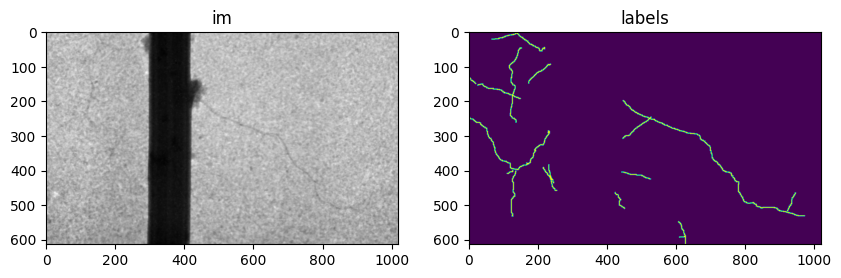

In [13]:
from skimage.io import imread, imsave
import napari
from tnia.deeplearning.dl_helper import make_patch_directory
from tnia.deeplearning.dl_helper import generate_patch_names
import os
from pathlib import Path
from tnia.plotting.plt_helper import imshow_multi2d
import numpy as np
import albumentations as A
import json

tnia_images_path = Path(r'D:/images')
parent_path=Path(tnia_images_path / r'tnia-python-images/imagesc/2024_01_12_plant_roots')
label_path = Path(parent_path / r'labels')
image_path = Path(label_path / r'images')
mask_path = Path(label_path / r'masks')

#name = '2_force_filtered'
#name = '18_filtered'
#name = '20_force_poolL_filtered'
name = '21_force_filtered'

im = imread(os.path.join(image_path / (name+".tif")))

print(im.shape)

#labels = np.zeros(im.shape, dtype=np.uint8)
labels = imread(os.path.join(mask_path / (name+".tif")))

fig = imshow_multi2d([im, labels], ['im', 'labels'], 1,2, colormaps=['gray', 'viridis'], width = 10, height = 10)

## Make directories to save patches

In [11]:
patch_path= parent_path / 'patches' / 'augment'
image_patch_path =  patch_path / 'input0'
label_patch_path =  patch_path / 'ground truth0'

if not os.path.exists(patch_path):
    os.mkdir(patch_path)
if not os.path.exists(image_patch_path):
    os.mkdir(image_patch_path)
if not os.path.exists(label_patch_path):
    os.mkdir(label_patch_path)

patch_base_name = name
axes = 'YX'
sub_sample = 1

make_patch_directory(1, 1, patch_path)

# Load the existing JSON data which is created when making the patch directory and append addition information to it
json_file = patch_path / "info.json"

with open(json_file, 'r') as infile:
    data = json.load(infile)

# add the sub_sample information to the JSON file
data['sub_sample'] = sub_sample 
data['axes'] = axes

# Write the modified data back to the JSON file
with open(json_file, 'w') as outfile:
    json.dump(data, outfile)


## Create random patches

We randomly crop a p by p (where p is the patch size) section from the image then apply the augmentation function.  The augmentation function is composed of Flips, Rotations, and resizing.  We can also potentially apply intensity transforms. 

(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_100.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_100.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_101.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_101.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_102.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_102.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_103.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_103.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roo

C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_100.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_101.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_102.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_103.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ip

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_105.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_105.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_106.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_106.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_107.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_107.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_105.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_106.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_107.tif is a low contrast image
  imsave(patch_name, label_aug)


D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_108.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_108.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_109.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_109.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_110.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_110.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_111.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_111.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_112.tif D:\images\t

C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_108.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_109.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_109.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_110.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_113.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_113.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_114.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_114.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_115.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_115.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_116.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_116.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_117.tif D:\images\t

C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_113.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_113.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_114.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_115.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_118.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_118.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_119.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_119.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_120.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_120.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_121.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_121.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_122.tif D:\images\t

C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_118.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_119.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_120.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_121.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ip

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_123.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_123.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_124.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_124.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_125.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_125.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_126.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_126.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_123.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_123.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_124.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_125.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_127.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_127.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_128.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_128.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_129.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_129.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_127.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_127.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_128.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_129.tif is a low contrast image
  imsave(patch_name, label_aug)


D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_130.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_130.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_131.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_131.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_132.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_132.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_133.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_133.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_130.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_131.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_132.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_132.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_134.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_134.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_135.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_135.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_136.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_136.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_137.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_137.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_138.tif D:\images\t

C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_134.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_135.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_136.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_137.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ip

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_139.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_139.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_140.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_140.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_141.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_141.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_142.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_142.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_139.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_140.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_141.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_142.tif is a low contrast image
  imsave(patch_name, label_aug)


D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_143.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_143.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_144.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_144.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_143.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_144.tif is a low contrast image
  imsave(patch_name, label_aug)


D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_145.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_145.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_146.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_146.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_147.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_147.tif
(448, 448) (448, 448)
D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_148.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_148.tif
(448, 448) (448, 448)


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_145.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:42: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_146.tif is a low contrast image
  imsave(image_name, im_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_146.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_147.tif is a low contrast image
  imsave(patch_name, label_aug)
C:\Users\bnort\AppData\Local\Temp\ipykernel_46

D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\input0/roots_149.tif D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_149.tif


C:\Users\bnort\AppData\Local\Temp\ipykernel_46916\4108161976.py:43: UserWarning: D:\images\tnia-python-images\imagesc\2024_01_12_plant_roots\patches\augment\ground truth0/roots_149.tif is a low contrast image
  imsave(patch_name, label_aug)


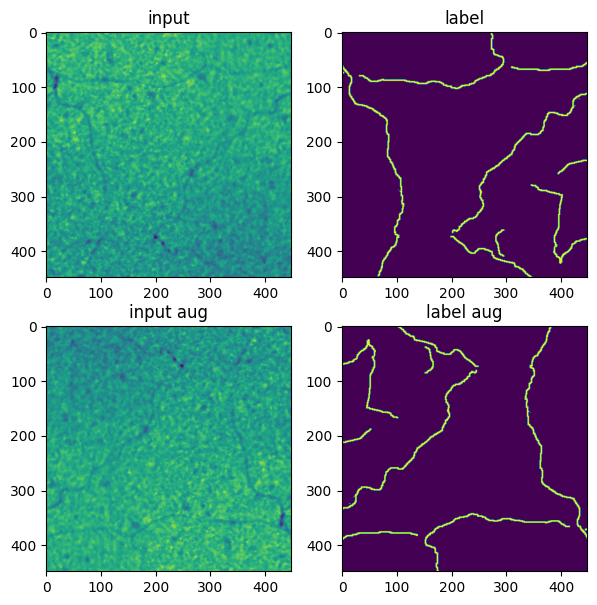

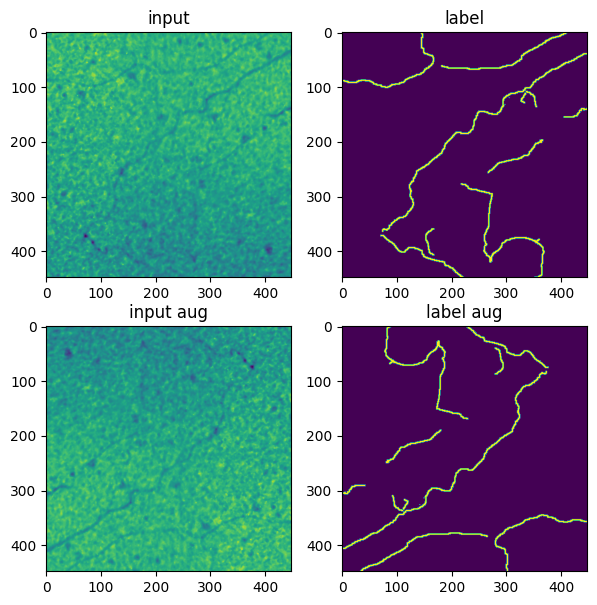

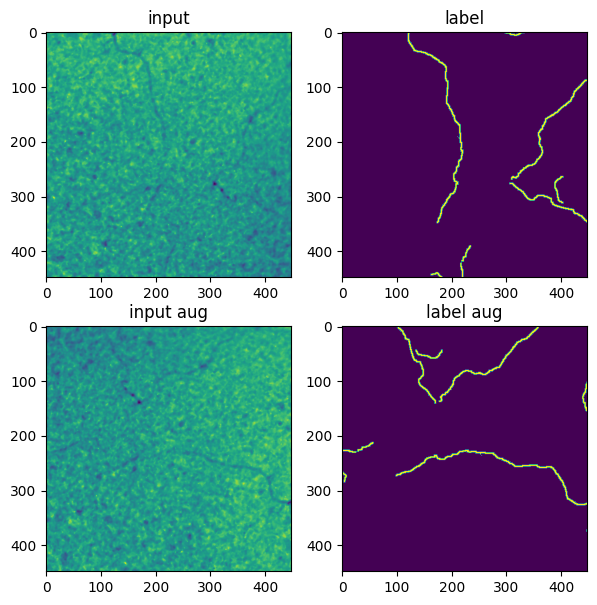

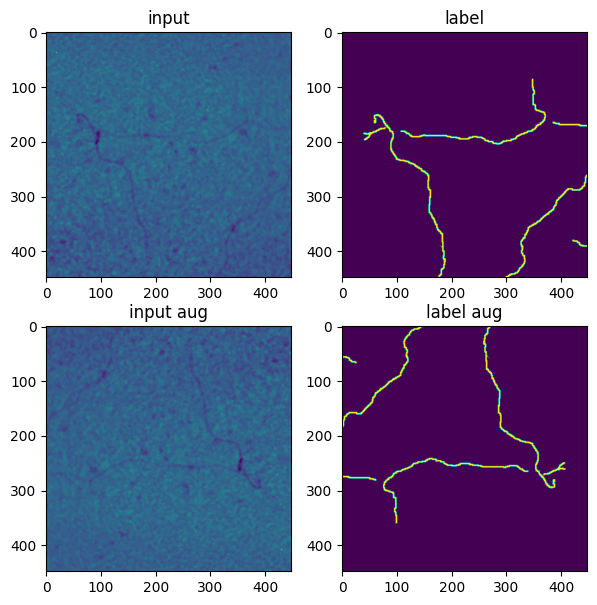

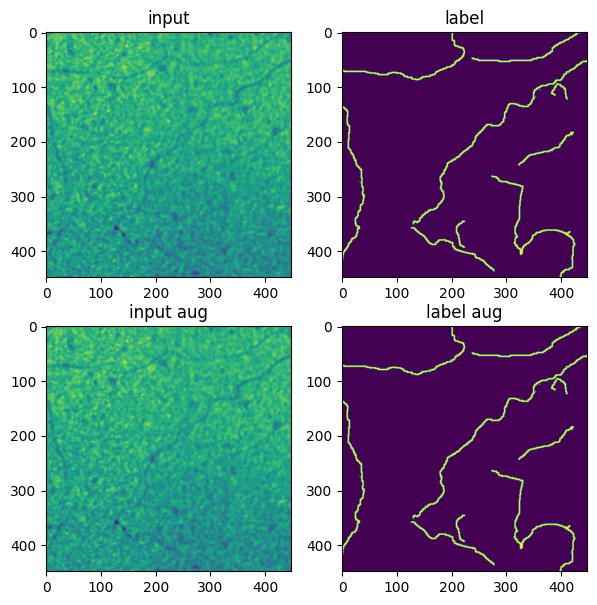

...

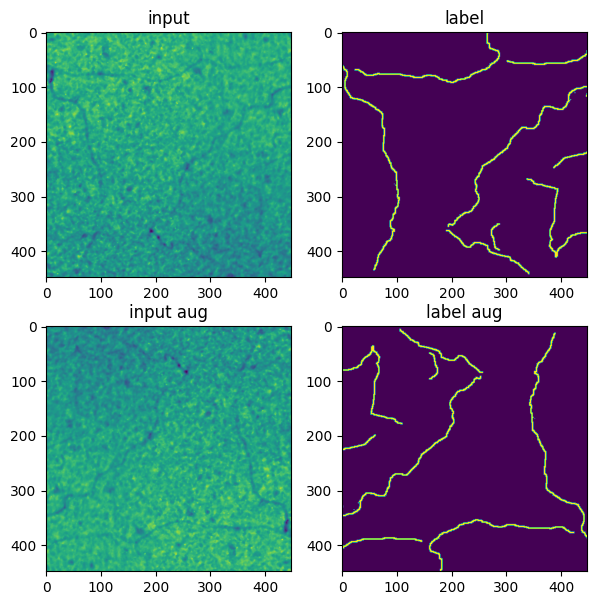

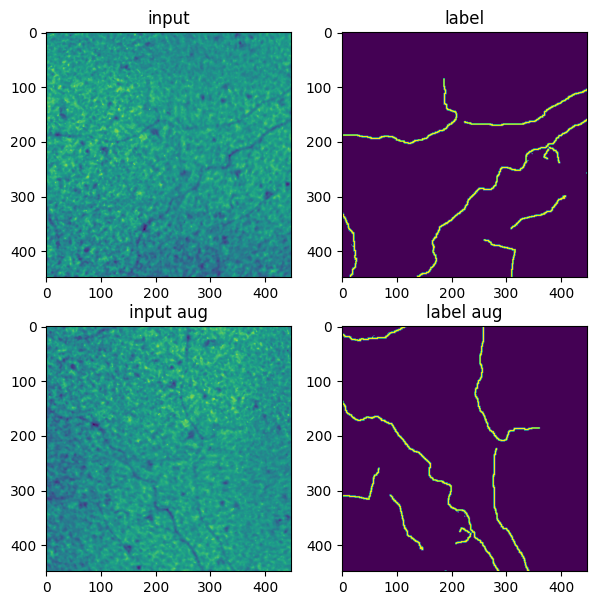

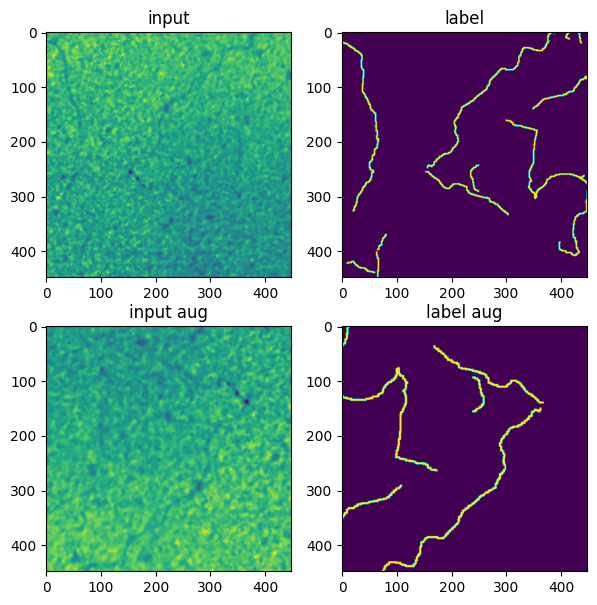

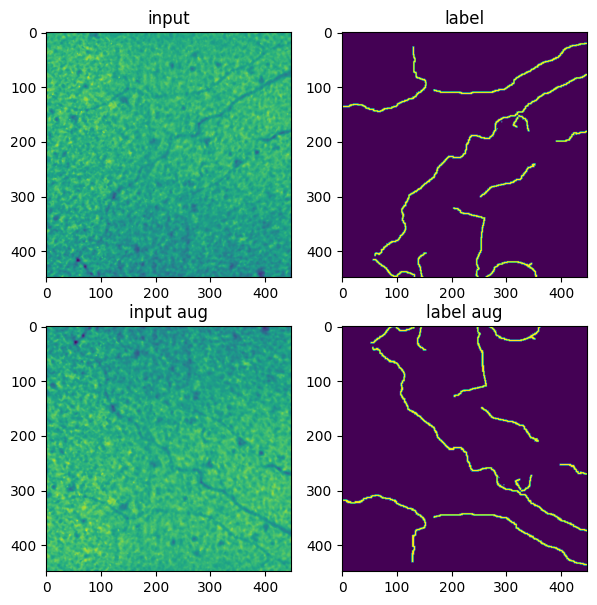

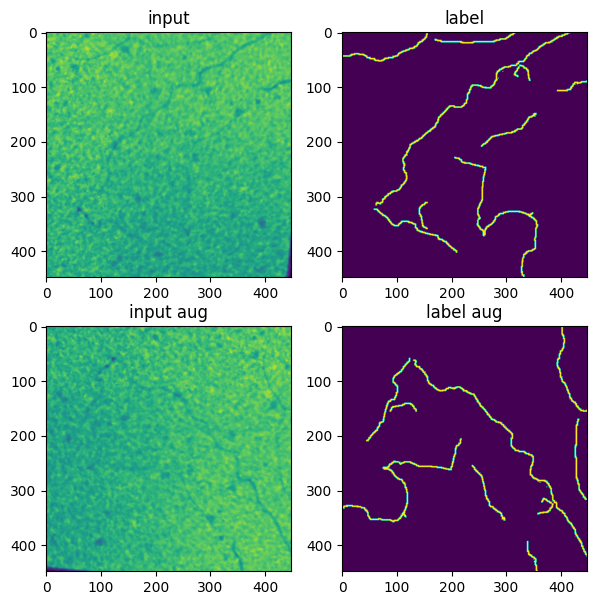

In [12]:
from random import randint
import numpy as np

patch_size = 448

num_patches = 50

for i in range(num_patches):
    x=randint(0,im.shape[1]-patch_size-1)
    y=randint(0,im.shape[0]-patch_size-1)

    ind = np.s_[y:y+patch_size, x:x+patch_size]
        
    aug = A.Compose([
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip(p=0.5),              
        A.RandomRotate90(p=0.5),
        A.RandomSizedCrop(min_max_height=(patch_size//2, patch_size), height=patch_size, width=patch_size, p=0.5),
        #A.RandomBrightnessContrast(p=0.8),
        #A.RandomGamma(p=0.8),
        ]
    )

    augmented = aug(image=im[ind], mask=labels[ind])

    im_aug = augmented['image']
    label_aug = augmented['mask']

    print(im_aug.shape, label_aug.shape)

    fig = imshow_multi2d([im[ind], labels[ind], im_aug, label_aug], ['input', 'label','input aug', 'label aug'], 2,2, width=7, height=7)

    patch_base_name = 'roots'

    #image_name, patch_name = generate_patch_names(str(image_patch_path), str(label_patch_path), patch_base_name)
    #print(image_name, patch_name)
    #imsave(image_name, im[ind])
    #imsave(patch_name, labels[ind])

    image_name, patch_name = generate_patch_names(str(image_patch_path), str(label_patch_path), patch_base_name)
    print(image_name, patch_name)
    imsave(image_name, im_aug)
    imsave(patch_name, label_aug)